In [14]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [15]:
import pickle as pkl
import torch
from pathlib import Path
from typing import List, Tuple
from PIL import Image, ImageDraw, ImageFont
import os, cv2 as cv
import json
import numpy as np

In [26]:
class Draw:
    maxalpha = 255
    def __init__(self, width=22, height=22, **kw):
        self.width, self.height = width, height
        
    def draw(self, canvas, box_x=0, box_y=0, opacity=1.0): 
        localcanvas = canvas.crop((box_x, box_y, box_x + self.get_width(), box_y + self.get_height()))
        self._draw(localcanvas, opacity=opacity)
        canvas.paste(localcanvas, (box_x, box_y))
        
    def _draw(self, canvas, opacity=1.0): pass
    def drawself(self):
        canvas = Image.new('RGBA', (self.get_width(), self.get_height()), (255, 255, 255, 0))
        self.draw(canvas, 0, 0, 1)
        return canvas
    
    def get_width(self): return self.width
    def get_height(self): return self.height
    
        
class OverlayDraw(Draw):
    def __init__(self, base:Draw, overlay:Draw, *args, overlay_opacity=1.0, **kw):
        self.base, self.overlay = base, overlay
        assert self.base.get_width() == self.overlay.get_width()
        assert self.base.get_height() == self.overlay.get_height()
        self.overlay_opacity = overlay_opacity
        
    def get_width(self): return self.base.get_width()
    def get_height(self): return self.base.get_height()
    
    def _draw(self, canvas, opacity=1.0):
        self.base._draw(canvas, opacity=opacity)
        self.overlay._draw(canvas, opacity=opacity * self.overlay_opacity)
        
        
class DrawLayers(Draw):
    def __init__(self, *layers:Tuple[Draw], overlay_opacity=1.0, **kw):
        self.layers = layers
        basesize = (self.layers[0].get_width(), self.layers[0].get_height())
        for layer in self.layers:
            assert (layer.get_width(), layer.get_height()) == basesize
        self.overlay_opacity = overlay_opacity
        
    def get_width(self): return self.layers[0].get_width()
    def get_height(self): return self.layers[0].get_height()
    
    def _draw(self, canvas, opacity=1.0):
        for i, layer in enumerate(self.layers):
            if i == 0:
                layer._draw(canvas, opacity=opacity)
            else:
                layer._draw(canvas, opacity=opacity * self.overlay_opacity)

        
class DrawImage(Draw):
    def __init__(self, image, imgsize=256, **kw):
        super().__init__(**kw)
        self.image = image.convert("RGBA")
        self.imgsize = (imgsize, imgsize) if isinstance(imgsize, int) else imgsize
        self.width, self.height = self.imgsize
        
    def _draw(self, canvas, opacity=1.0):
        img = self.image.resize(self.imgsize)
        img.putalpha(int(opacity * self.maxalpha))
        canvas.alpha_composite(img)
    
    
class DrawText(Draw):
    def __init__(self, text, fontsize=28, width=3*256+2*3, height=100, offset=(0,0), bold=False, italic=False, condensed=False, color=(0, 0, 0), **kw):
        super().__init__(**kw)
        self.text, self.fontsize, self.width, self.height = text, fontsize, width, height
        
        font_name = "DejaVuSans" if not condensed else "DejaVuSansCondensed"
        font_name_append = ""
        if bold:
            font_name_append += "Bold"
        if italic: 
            font_name_append += "Oblique"
        
        font_path = os.path.join(cv.__path__[0],'qt','fonts', 
                font_name + ("-" + font_name_append if font_name_append != "" else "") + '.ttf')
        print(font_path)
        
        self.font = font = ImageFont.truetype(font_path, self.fontsize)
        self.textcolor = color
        self.offset = offset
        
    def _draw(self, canvas, opacity=1.0):
        txtimg = Image.new("RGBA", (self.get_width(), self.get_height()), (255,255,255,0))
        draw = ImageDraw.Draw(txtimg)
        x = self.width // 2 + self.offset[0]
        y = self.height // 2 + self.offset[1]
        draw.text((x, y), self.text, fill=self.textcolor + (int(opacity * self.maxalpha),), font=self.font, anchor="mm", align="center")
        canvas.alpha_composite(txtimg)
        
        
class DrawRow(Draw):
    def __init__(self, *items, margin=3, **kw):
        super().__init__(**kw)
        self.kw = kw
        self.items = items
        self.margin = margin
        
    def get_width(self):
        ret = sum([item.get_width() for item in self.items])
        ret += self.margin * (len(self.items) - 1)
        return ret
        
    def get_height(self):
        return max([item.get_height() for item in self.items])
        
    def __add__(self, other):
        ret = type(self)(*(self.items + other.items), margin=self.margin, **self.kw)
        return ret
    
    def draw(self, canvas, x=0, y=0, opacity=1.0):
        for item in self.items:
            item.draw(canvas, x, y, opacity=opacity)
            x += item.get_width() + self.margin
            
            
class DrawCol(DrawRow):
    def get_width(self):
        return max([item.get_width() for item in self.items])
        
    def get_height(self):
        ret = sum([item.get_height() for item in self.items])
        ret += self.margin * (len(self.items) - 1)
        return ret
    
    def draw(self, canvas, x=0, y=0, opacity=1.0):
        for item in self.items:
            item.draw(canvas, x, y, opacity=opacity)
            y += item.get_height() + self.margin

In [22]:
IMGRES = 256
# IMGRES = 512     # for appendix


def get_image_draws(exppath, label=None, which=(0, (0,)), imgsize=IMGRES, use_seg=False, show_scribble=False):
    with open(Path(exppath) / "outbatches.pkl", "rb") as f:
        outbatches = pkl.load(f)

    imagerow = []
    for whichspec in which:
        batchid, whichseeds = whichspec
        outbatch = outbatches[batchid]
        for whichseed in whichseeds:
            example = outbatch[whichseed]
            imgdata = example.image_data if not use_seg else example.seg_data.convert("L")
            if show_scribble:
                cond_imgtensor_np = (np.array(imgdata) * 255).astype("uint8")
                canny = cv.Canny(cond_imgtensor_np, 20, 50)
                scribbleradius = 5      # TODO: check scribble brush size
                brush = np.zeros((scribbleradius*2+1, scribbleradius*2+1))
                cv.circle(brush, (scribbleradius, scribbleradius), 0, 1, scribbleradius*2)
                cond_scribbles = cv.filter2D(src=canny, ddepth=-1, kernel=brush) > 0
                imgdata = Image.fromarray(cond_scribbles)
            
            imagerow.append(DrawImage(imgdata, imgsize=imgsize))
        imagerow.append(Draw(20, 0))
    del imagerow[-1]
    return DrawRow(*imagerow)    


def display_bboxes(bboxes, prompts=None, size=(512, 512), _img=None, linewidth=3):
    img = Image.new(mode="RGB", size=size) if _img is None else _img.copy()
    width, height = img.size
    imdraw = ImageDraw.Draw(img)
    if prompts is None:
        prompts = [None] * len(bboxes)
    for bbox, prompt in zip(bboxes, prompts):
        imdraw.rectangle([(int(bbox[0] * width), int(bbox[1] * height)), (int(bbox[2] * width), int(bbox[3] * height))], outline=(255, 0, 0), width=linewidth)
        if prompt is not None:
            imdraw.text((int(bbox[0] * width), int(bbox[1] * height)), prompt, font_size=32)
    return img


def get_image_draws_gligen(exppath, label=None, which=(0, (0,)), imgsize=IMGRES, drawboxes=False):
    with open(Path(exppath) / "outbatches.pkl", "rb") as f:
        outbatches = pkl.load(f)

    imagerow = []
    for whichspec in which:
        batchid, whichseeds = whichspec
        outbatch = outbatches[batchid]
        for whichseed in whichseeds:
            example = outbatch[whichseed]
            imgdata = example["image"]
            if drawboxes:
                imgdata = display_bboxes(example["bboxes"], _img=imgdata)
            imagerow.append(DrawImage(imgdata, imgsize=imgsize))
        imagerow.append(Draw(20, 0))
    del imagerow[-1]
    return DrawRow(*imagerow)    


def get_image_draws_dd(exppath, label=None, which=(0, (0,)), imgsize=IMGRES):
    with open(Path(exppath) / "outbatches.pkl", "rb") as f:
        outbatches = pkl.load(f)

    imagerow = []
    for whichspec in which:
        batchid, whichseeds = whichspec
        outbatch = outbatches[batchid]
        for whichseed in whichseeds:
            example = outbatch[whichseed]
            imgdata = example["image"]
            imagerow.append(DrawImage(imgdata, imgsize=imgsize))
        imagerow.append(Draw(20, 0))
    del imagerow[-1]
    return DrawRow(*imagerow)    

# /USERSPACE/lukovdg1/DenseDiffusion/gligen_outputs/with_bgr/tau=1.0/threeorange1_1_out

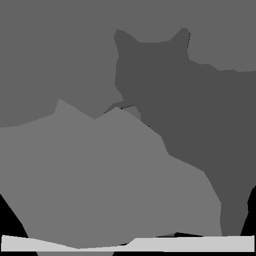

In [23]:
final = []
dd = get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_global_v5_exp_1/generated_catdog.pkl_1", 
               which=((0, (0,)), (0, (0,))),
               use_seg=True)
final.append(dd.items[0])
final = DrawRow(*final, margin=0)
display(final.drawself())


## About

In this script, we're creating an image tables for qualitative comparisons.

### Main comparison

/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSansCondensed.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSansCondensed.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSansCondensed.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSansCondensed-Oblique.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSansCondensed-Oblique.ttf


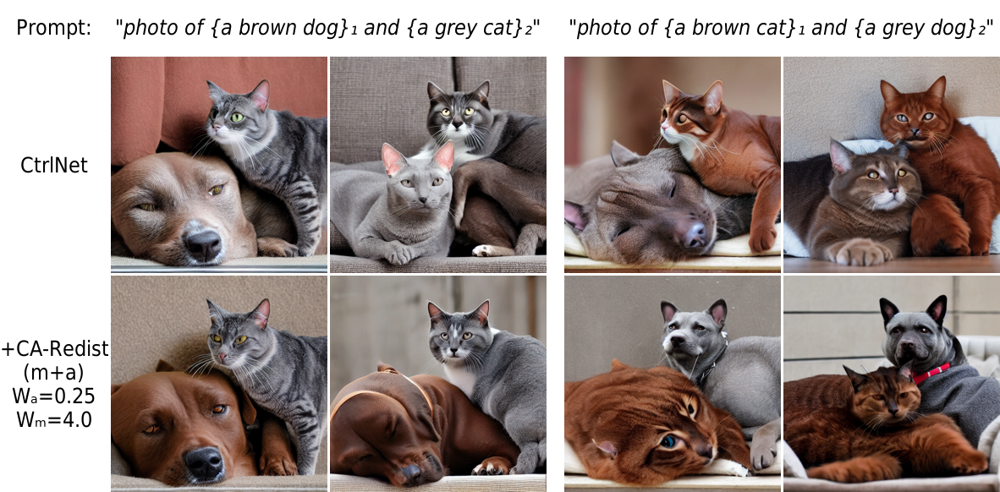

In [57]:
cols = []
FONTSIZE = 25
textwidth = 128

firstcol = DrawCol(
    DrawText("Prompt:", fontsize=FONTSIZE, height=64, width=textwidth, condensed=True),
    DrawText("CtrlNet", fontsize=FONTSIZE, height=256, width=textwidth, condensed=True),
    DrawText("+CA-Redist\n(m+a)\nWₐ=0.25\nWₘ=4.0", fontsize=FONTSIZE, height=256, width=textwidth, condensed=True),
#     DrawText("+CA-Redist\n(none)\nWₐ=0.0\nWₘ=0.0", fontsize=FONTSIZE, height=256, width=textwidth, condensed=True),
)

# display(firstcol.drawself())


selectedseeds = (1, 2)
secondcol = DrawCol(
    DrawText('"photo of {a brown dog}₁ and {a grey cat}₂"', 
                     fontsize=FONTSIZE, height=64, italic=True, condensed=True,
                     width=len(selectedseeds)*256+(len(selectedseeds) - 1) * 3), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_global_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_5/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )),
#     DrawRow(
#     get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_1/generated_catdog.pkl_1", 
#                "ControlNet*", 
#                which=((0, selectedseeds),)
#     ))
)


thirdcol = DrawCol(
    DrawText('"photo of {a brown cat}₁ and {a grey dog}₂"', 
                     fontsize=FONTSIZE, height=64, italic=True, condensed=True,
                     width=len(selectedseeds)*256+(len(selectedseeds) - 1) * 3), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_global_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )),  
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_5/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )), 
#     DrawRow(
#     get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_1/generated_catdog.pkl_1", 
#                "ControlNet*", 
#                which=((1, selectedseeds),)
#     ))
)

display(DrawRow(firstcol, secondcol, Draw(15, 15), thirdcol).drawself())

/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSans.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSansCondensed-Oblique.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSansCondensed-Oblique.ttf
/home/lukovdg1/.local/lib/python3.9/site-packages/cv2/qt/fonts/DejaVuSansCondensed-Oblique.ttf
/home/lukovdg

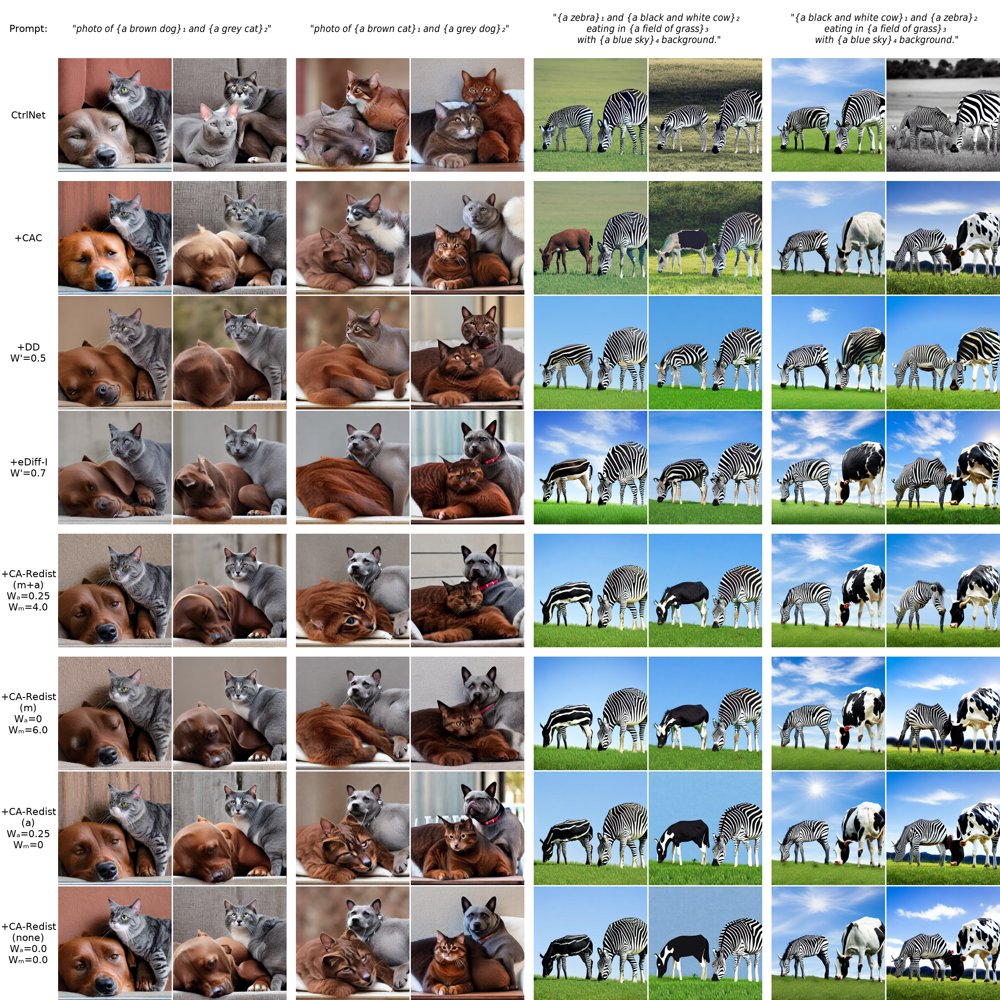

In [71]:
cols = []
FONTSIZE = 22
textwidth = 128

firstcol = DrawCol(
    DrawText("Prompt:", fontsize=FONTSIZE, height=64*2, width=textwidth),
    DrawText("CtrlNet", fontsize=FONTSIZE, height=256, width=textwidth),
    Draw(15, 15),
    DrawText("+CAC", fontsize=FONTSIZE, height=256, width=textwidth),
    DrawText("+DD\nW'=0.5", fontsize=FONTSIZE, height=256, width=textwidth),
    DrawText("+eDiff-I\nW'=0.7", fontsize=FONTSIZE, height=256, width=textwidth),
    Draw(15, 15),
    DrawText("+CA-Redist\n(m+a)\nWₐ=0.25\nWₘ=4.0", fontsize=FONTSIZE, height=256, width=textwidth),
    Draw(15, 15),
    DrawText("+CA-Redist\n(m)\nWₐ=0\nWₘ=6.0", fontsize=FONTSIZE, height=256, width=textwidth),
    DrawText("+CA-Redist\n(a)\nWₐ=0.25\nWₘ=0", fontsize=FONTSIZE, height=256, width=textwidth),
    DrawText("+CA-Redist\n(none)\nWₐ=0.0\nWₘ=0.0", fontsize=FONTSIZE, height=256, width=textwidth),
)

# display(firstcol.drawself())


selectedseeds = (1, 2)
secondcol = DrawCol(
    DrawText('"photo of {a brown dog}₁ and {a grey cat}₂"', 
                     fontsize=FONTSIZE, height=64*2, italic=True, condensed=True,
                     width=len(selectedseeds)*256+(len(selectedseeds) - 1) * 3), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_global_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )), 
    Draw(15, 15),
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_cac_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_dd_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_legacy-NewEdiffipp_v5_exp_2/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )),
    Draw(15, 15), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_5/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )),
    Draw(15, 15), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_2/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_4/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((0, selectedseeds),)
    ))
)


selectedseeds = (1, 2)
thirdcol = DrawCol(
    DrawText('"photo of {a brown cat}₁ and {a grey dog}₂"', 
                     fontsize=FONTSIZE, height=64*2, italic=True, condensed=True,
                     width=len(selectedseeds)*256+(len(selectedseeds) - 1) * 3), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_global_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )), 
    Draw(15, 15),
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_cac_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_dd_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_legacy-NewEdiffipp_v5_exp_2/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )),
    Draw(15, 15), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_5/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )),
    Draw(15, 15), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_2/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_4/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_1/generated_catdog.pkl_1", 
               "ControlNet*", 
               which=((1, selectedseeds),)
    ))
)

whichex = 2
selectedseeds = (0, 4)
fourthcol = DrawCol(
    DrawText('"{a zebra}₁ and {a black and white cow}₂ \n eating in {a field of grass}₃ \n with {a blue sky}₄ background."', 
                     fontsize=FONTSIZE, height=64*2, italic=True, condensed=True,
                     width=len(selectedseeds)*256+(len(selectedseeds) - 1) * 3), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_global_v5_exp_1/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    Draw(15, 15),
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_cac_v5_exp_1/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_dd_v5_exp_1/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_legacy-NewEdiffipp_v5_exp_2/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )),
    Draw(15, 15), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_5/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )),
    Draw(15, 15), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_2/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_4/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_1/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    ))
)

whichex = 3
fifthcol = DrawCol(
    DrawText('"{a black and white cow}₁ and {a zebra}₂ \n eating in {a field of grass}₃ \n with {a blue sky}₄ background."', 
                     fontsize=FONTSIZE, height=64*2, italic=True, condensed=True,
                     width=len(selectedseeds)*256+(len(selectedseeds) - 1) * 3), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_global_v5_exp_1/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    Draw(15, 15),
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_cac_v5_exp_1/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_dd_v5_exp_1/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_legacy-NewEdiffipp_v5_exp_2/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )),
    Draw(15, 15), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_5/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )),
    Draw(15, 15), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_2/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_4/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    )), 
    DrawRow(
    get_image_draws("/USERSPACE/lukovdg1/controlnet11/checkpoints/v5/checkpoints_coco_posattn5a_v5_exp_1/generated_zebra.pkl_1", 
               "ControlNet*", 
               which=((whichex, selectedseeds),)
    ))
)

display(DrawRow(firstcol, secondcol, Draw(15, 15), thirdcol, Draw(15, 15), fourthcol, Draw(15, 15), fifthcol).drawself())